In [6]:
#pip install folium 

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium 

from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

In [9]:
gdf = gpd.read_file(r'/Users/martinpalkovic/Desktop/Data_Science/Wildfires/USGS_Dataset/Wildfires_1878_2019_Polygon_Data/Shapefile/US_Wildfires_1878_2019.shp')

print(gdf.shape)
print(gdf.dtypes)

gdf.head()

(65845, 19)
FireName        object
FireCode        object
FireYear         int64
IgntDate        object
ContrlDate      object
ContnDate       object
Acres          float64
Hectares       float64
DataSrc         object
DataNotes       object
FireCause       object
FoundIn         object
FndNames        object
FndCodes        object
FndDates        object
FireQual         int64
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
dtype: object


,FireName,FireCode,FireYear,IgntDate,ContrlDate,ContnDate,Acres,Hectares,DataSrc,DataNotes,FireCause,FoundIn,FndNames,FndCodes,FndDates,FireQual,Shape_Leng,Shape_Area,geometry
0,414008,AK6535415457219840611,1984,1984-06-11,None,None,3169.156439,1282.513243,Monitoring Trends in Burn Severity,"First Tier Wildfires, polygon with largest acr...",No cause indicated,Alternate Fire Sources: Monitoring Trends in B...,Alternate Fire Names: 414008,Alternate Fire Codes: AK6535415457219840611,"Alternate Ignition, Controlled, and Contained ...",1,22876.846278,1.282513e+07,"POLYGON ((-2729116.221 3783619.593, -2728840.2..."
1,414012,AK6621715235619840618,1984,1984-06-18,None,None,1964.386646,794.959774,Monitoring Trends in Burn Severity,"First Tier Wildfires, polygon with largest acr...",No cause indicated,Alternate Fire Sources: Monitoring Trends in B...,Alternate Fire Names: 414012,Alternate Fire Codes: AK6621715235619840618,"Alternate Ignition, Controlled, and Contained ...",1,17290.576444,7.949598e+06,"POLYGON ((-2587275.964 3793164.935, -2586775.6..."
2,414057,AK6495716269319840702,1984,1984-07-02,None,None,1688.849283,683.453661,Monitoring Trends in Burn Severity,"First Tier Wildfires, polygon with largest acr...",No cause indicated,Alternate Fire Sources: Monitoring Trends in B...,Alternate Fire Names: 414057,Alternate Fire Codes: AK6495716269319840702,"Alternate Ignition, Controlled, and Contained ...",1,11226.497241,6.834537e+06,"POLYGON ((-3073104.885 3996965.523, -3073150.7..."
3,414060,AK6379515502919840623,1984,1984-06-23,None,None,1399.226822,566.247506,Monitoring Trends in Burn Severity,"First Tier Wildfires, polygon with largest acr...",No cause indicated,Alternate Fire Sources: Monitoring Trends in B...,Alternate Fire Names: 414060,Alternate Fire Codes: AK6379515502919840623,"Alternate Ignition, Controlled, and Contained ...",1,18047.888216,5.662475e+06,"POLYGON ((-2841528.411 3660892.172, -2841473.4..."
4,ABERT,OR4258812018119840809,1984,1984-08-09,None,None,7945.460289,3215.416542,Monitoring Trends in Burn Severity,"First Tier Wildfires, polygon with largest acr...",No cause indicated,Alternate Fire Sources: BLM National Fire Peri...,"Alternate Fire Names: Abert, Abert, ABERT","Alternate Fire Codes: M053, M053, OR4258812018...","Alternate Ignition, Controlled, and Contained ...",1,73017.681929,3.215417e+07,"POLYGON ((-1839066.540 551133.989, -1839104.37..."


In [10]:
gdf = gdf[['FireName', 'FireYear', 'Acres', 'FireCause', 'Shape_Leng', 'Shape_Area', 'geometry']]
gdf['Acres'] = gdf['Acres'].astype('int')

gdf_plot = gdf.loc[gdf['Acres'] > 1000]

gdf = gdf.loc[gdf['Acres'] > 100000]

print(gdf.shape)
gdf.head()

(280, 7)


,FireName,FireYear,Acres,FireCause,Shape_Leng,Shape_Area,geometry
53,HANFORD,1984,122914,No cause indicated,198131.918734,4.974158e+08,"POLYGON ((-1707331.706 983937.893, -1707277.50..."
54,HAWK CREEK,1984,157777,No cause indicated,387433.830671,6.385031e+08,"POLYGON ((-882294.333 813800.947, -882251.095 ..."
200,ALLAN ROAD,1985,110696,No cause indicated,173482.993633,4.479717e+08,"MULTIPOLYGON (((1689954.222 -328483.065, 16899..."
683,WHEELER #2,1985,173560,No cause indicated,249902.450958,7.023770e+08,"POLYGON ((-2017986.369 -380524.087, -2017824.0..."
710,BISSELL CK,1986,103497,No cause indicated,217633.714703,4.188402e+08,"POLYGON ((-1526653.364 665529.096, -1526606.78..."


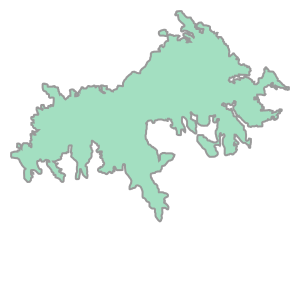

In [19]:
gdf['geometry'].iloc[1]

In [ ]:
# gdf = gdf.to_file('USGS_Wildfires.json', driver = 'GeoJSON')

# gdf = gpd.read_file('USGS_Wildfires.json', driver = 'GeoJSON')

# gdf.head()

In [4]:
import branca.colormap as cm

fire_min = gdf['Acres'].min()
fire_max = gdf['Acres'].max()
fire_75 = gdf['Acres'].quantile(q = 0.75)

linear = cm.linear.RdYlBu_08.scale(fire_min, fire_75)
#linear = cm.LinearColormap(['orange', 'red'], vmin = fire_min, vmax = 1000000)

def reversed_colormap(existing):
    return cm.LinearColormap(
        colors=list(reversed(existing.colors)),
        vmin=existing.vmin, vmax=existing.vmax)

linear = reversed_colormap(linear)
linear

In [5]:
cm.linear

viridis
Pastel1_03
Pastel1_05
Pastel1_04
Pastel1_07


In [ ]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

m = folium.Map(
    location = [39, -105],
    tiles = 'Stamen Terrain',
    zoom_start = 6)

fire_dict = dict(zip(gdf['FireName'], gdf['Acres']))
#fire_dict = gdf.set_index('FireName')['Acres']
#fire_dict

tooltip = GeoJsonTooltip(
    fields = ['FireName', 'FireYear', 'Acres', 'FireCause'],
    aliases = ['Name', 'Year', 'Acres', 'Cause'],
    #localize = True,
    sticky = True,
    labels = True,
    style = """
    background-color: #F0EFEF;
    border: 2px solid black;
    border-radius: 3px,
    box-shadow: 3px;
    """,
    max_width = 800
)


    
map_colors = lambda x: {
    'fillColor': linear(fire_dict[x['properties']['FireName']]),
    'color': 'black',
    'weight': 0.25,
    'fillOpacity': 0.5
}

#define a function for map_colors, if you prefer
# def map_colors(x):
#     return {'opacity': 1,
#             'weight': 0.5,
#             'fillColor': linear(fire_dict[x['properties']['FireName']]),
#             'color':'black'}


folium.GeoJson(
    gdf,
    name = 'Wildfires',
    style_function = map_colors,
    tooltip = tooltip
).add_to(m)

folium.LayerControl(collapsed = False).add_to(m)

#m.save(r'USGS_wildfires.html')

m